# Simulating time evolution of a simple two level system in QuTiP


Any two level system's hamiltonian can be mapped to a linear combination of Sigma operators and the Identity.


$H = \overrightarrow{n} \cdot \overrightarrow{\sigma} + a I$

where $\overrightarrow{n}$ can be rappresented in the Bloch's sphere

In [13]:
# from qutip.ipynbtools import version_table; version_table()
from qutip import basis, sigmax, sigmaz, sigmay, identity, Bloch
from qutip import mesolve, Options, Qobj
from math import pi, sqrt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D

from IPython.display import display, display_latex
from IPython.display import HTML

Let's build a function for retrieving the hamiltonian of the two level system by giving the $\overrightarrow{n}$ vector

In [14]:
def H_two_level_system(n:list) -> Qobj:
    """
    Hamiltonian for a two-level system.
    """
    return n[0] * sigmax() + n[1] * sigmay() + n[2] * sigmaz() + n[3] * identity(2)

Let's visualize the n vector and the initial state

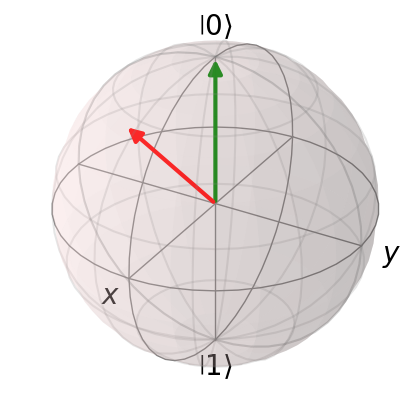

In [15]:
tlist = np.linspace(0, 10, 100)  # Time list for the simulation

psi0 = basis(2, 0)  # Initial state |0> of the two-level system
n = [1, 0, 1, 0]  # Coefficients for the Hamiltonian terms

fig = plt.figure(figsize=(4, 4))  # Create a figure for the Bloch sphere
b = Bloch(fig=fig)  # Create a Bloch sphere object
b.make_sphere()  # Create the Bloch sphere visualization
b.add_vectors([n[0], n[1], n[2]])  # Add points to the Bloch sphere
b.add_states(psi0)  # Add the initial state to the Bloch sphere
b.vector_color = ['r', 'g']  # Set colors for the vectors
b.render()

<>:7: SyntaxWarning: invalid escape sequence '\s'
<>:7: SyntaxWarning: invalid escape sequence '\s'
C:\Users\yehan\AppData\Local\Temp\ipykernel_6188\2035930933.py:7: SyntaxWarning: invalid escape sequence '\s'
  plt.title("Expectation values of the two-level system over $\sigma_j$ observables")
c:\Users\yehan\Documents\Programming\Quantum-Simulations\.venv\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(


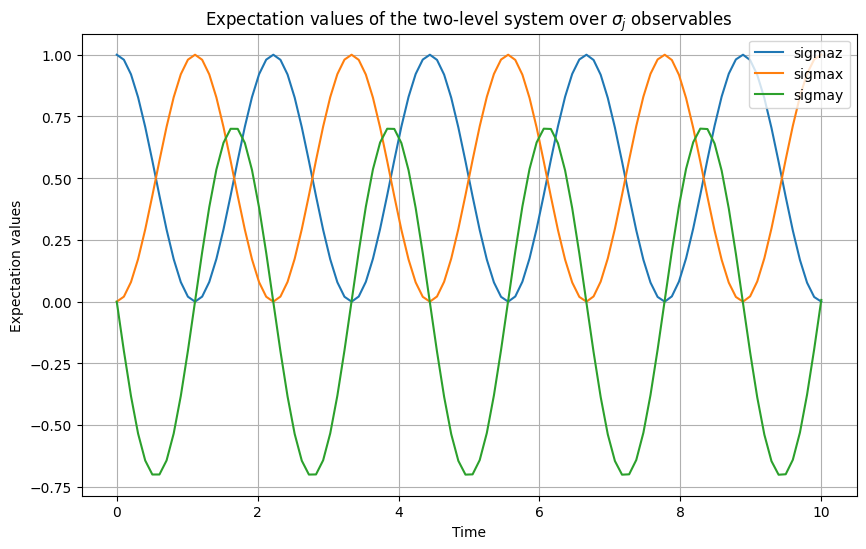

In [16]:
tlist = np.linspace(0, 10, 100)  # Time list for the simulation

# Simulate the time evolution of the two-level system
output = mesolve(H_two_level_system(n), psi0, tlist, e_ops=[sigmaz(), sigmax(), sigmay()], options=Options(nsteps=1000))

plt.figure(figsize=(10, 6))
plt.title("Expectation values of the two-level system over $\sigma_j$ observables")
plt.plot(tlist, output.expect[0], label="sigmaz")
plt.plot(tlist, output.expect[1], label="sigmax")
plt.plot(tlist, output.expect[2], label="sigmay")
plt.xlabel("Time")
plt.ylabel("Expectation values")
plt.legend(loc="upper right")
plt.grid()
plt.show()

We can clearly see the Rabi Oscillations of the system.
Depending on the observable we can have different oscillation outcomes

In [23]:
n = [0, 0, 1, 0]  # bloch vector

psi0 = 1/sqrt(2) * (basis(2, 0) + basis(2, 1))
tlist = np.linspace(0, 10, 100)  # Time list for the simulation
output = mesolve(H_two_level_system(n), psi0, tlist, options=Options(nsteps=1000))

# Create a 3D plot of a sphere
fig = plt.figure(figsize=(6, 6))
ax = fig.add_subplot(111, projection='3d')

b = Bloch(fig=fig, axes=ax)
trace_points = [] # List to store trace points

def update(frame):
    b.clear()
    b.add_vectors([n[0], n[1], n[2]])  # Add points to the Bloch sphere

    b.add_states(output.states[frame])

    b.vector_color = ['r', 'g']  # Set colors for the vectors
    b.render()

def init():
    b.clear()
    b.render()
    # Set labels and title
    ax.set_xlabel('X')
    ax.set_ylabel('Y')
    ax.set_zlabel('Z')
    ax.set_title('3D Sphere')

ani = animation.FuncAnimation(fig, update, frames=len(output.states), init_func=init, blit=False, interval=100, repeat=True)
ani.save('bloch_sphere.gif', writer='Pillow', fps=10)
plt.close()

# Display the animation in Jupyter Notebook
HTML(ani.to_jshtml())

c:\Users\yehan\Documents\Programming\Quantum-Simulations\.venv\Lib\site-packages\qutip\solver\options.py:16: FutureWarning: Dedicated options class are no longer needed, options should be passed as dict to solvers.
  warnings.warn(
MovieWriter Pillow unavailable; using Pillow instead.


Conclusions:

The statevector makes a precession around the n vector 